In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point
import pandas as pd
from tqdm import tqdm_notebook as tqdm
import numpy as np
import contextily as ctx
%matplotlib inline

### reading and experimenting with .shp file and other formats with Geopandas

In [2]:
precinct_data = gpd.read_file("./Hav_Precincts&Wards_Shp/Precincts_Wards.shp")

In [3]:
precinct_data.head()

,Ward,Precinct,GlobalID,Map_Year,Shape_STAr,Shape_STLe,geometry
0,7,7-2,{E0A75AE1-F95F-4826-9811-27AE0ED1E7AE},2003,4.998120e+07,32599.612224,"POLYGON ((767153.6669999957 3100988.333000004,..."
1,7,7-1,{FC0DEE9C-859D-4B4B-B122-7CBF4109C4C6},2003,1.484858e+07,22649.952407,"POLYGON ((771961.0289999992 3105554.114999995,..."
2,7,7-3,{E3D642C6-EDFD-46AD-8C62-CE1530614B2E},2003,1.030715e+08,43412.461717,"POLYGON ((775919.2370000035 3103349.129999995,..."
3,2,2-3,{EBED3BA9-DF2B-4E14-99F7-5ED91A8530CD},2003,9.890772e+06,18994.299125,"POLYGON ((767289.8310000002 3106392.620000005,..."
4,2,2-1,{ED501DB5-A8AE-4B58-ABD2-C954236FA3D7},2003,1.104776e+07,16983.417294,"POLYGON ((771937.1480000019 3106811.819999993,..."


In [4]:
for col in precinct_data.columns:
    print(col)

Ward
Precinct
GlobalID
Map_Year
Shape_STAr
Shape_STLe
geometry


In [5]:
precinct_data.Ward.value_counts()

1    6
5    6
3    6
7    6
2    6
4    6
6    6
Name: Ward, dtype: int64

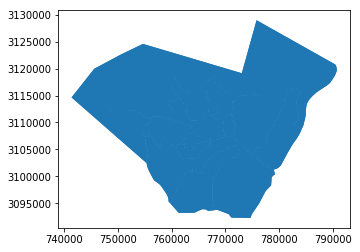

In [6]:
precinct_data.plot()

In [7]:
pdata1 = gpd.read_file("./Hav_Precincts&Wards_Shp/Precincts_Wards.dbf")

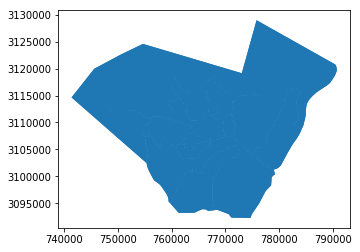

In [8]:
pdata1.plot()

In [9]:
pdata1.head()

,Ward,Precinct,GlobalID,Map_Year,Shape_STAr,Shape_STLe,geometry
0,7,7-2,{E0A75AE1-F95F-4826-9811-27AE0ED1E7AE},2003,4.998120e+07,32599.612224,"POLYGON ((767153.6669999957 3100988.333000004,..."
1,7,7-1,{FC0DEE9C-859D-4B4B-B122-7CBF4109C4C6},2003,1.484858e+07,22649.952407,"POLYGON ((771961.0289999992 3105554.114999995,..."
2,7,7-3,{E3D642C6-EDFD-46AD-8C62-CE1530614B2E},2003,1.030715e+08,43412.461717,"POLYGON ((775919.2370000035 3103349.129999995,..."
3,2,2-3,{EBED3BA9-DF2B-4E14-99F7-5ED91A8530CD},2003,9.890772e+06,18994.299125,"POLYGON ((767289.8310000002 3106392.620000005,..."
4,2,2-1,{ED501DB5-A8AE-4B58-ABD2-C954236FA3D7},2003,1.104776e+07,16983.417294,"POLYGON ((771937.1480000019 3106811.819999993,..."


In [10]:
pdata2 = gpd.read_file("./Hav_Precincts&Wards_Shp/Precincts_Wards.shp")

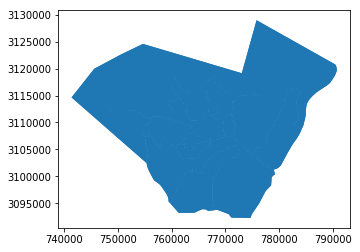

In [11]:
pdata2.plot()

In [12]:
pdata2.head()

,Ward,Precinct,GlobalID,Map_Year,Shape_STAr,Shape_STLe,geometry
0,7,7-2,{E0A75AE1-F95F-4826-9811-27AE0ED1E7AE},2003,4.998120e+07,32599.612224,"POLYGON ((767153.6669999957 3100988.333000004,..."
1,7,7-1,{FC0DEE9C-859D-4B4B-B122-7CBF4109C4C6},2003,1.484858e+07,22649.952407,"POLYGON ((771961.0289999992 3105554.114999995,..."
2,7,7-3,{E3D642C6-EDFD-46AD-8C62-CE1530614B2E},2003,1.030715e+08,43412.461717,"POLYGON ((775919.2370000035 3103349.129999995,..."
3,2,2-3,{EBED3BA9-DF2B-4E14-99F7-5ED91A8530CD},2003,9.890772e+06,18994.299125,"POLYGON ((767289.8310000002 3106392.620000005,..."
4,2,2-1,{ED501DB5-A8AE-4B58-ABD2-C954236FA3D7},2003,1.104776e+07,16983.417294,"POLYGON ((771937.1480000019 3106811.819999993,..."


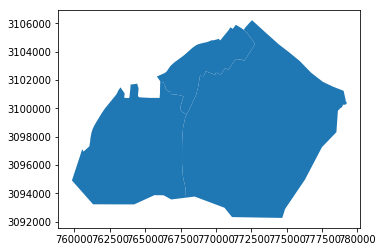

In [13]:
pdata2.loc[[37,38,41],'geometry'].plot()

In [14]:
# a = pdata2['geometry'][0]

In [15]:
# print(a)

In [16]:
pdata2.crs

{'init': 'epsg:2249'}

In [17]:
from fiona.crs import from_epsg

# Set the GeoDataFrame's coordinate system to WGS84 (i.e. epsg code 4326)
pdata3 = pdata2.to_crs(epsg=4326)

/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


In [18]:
print(pdata2.crs)
print(pdata3.crs)

{'init': 'epsg:2249'}
{'init': 'epsg:4326', 'no_defs': True}


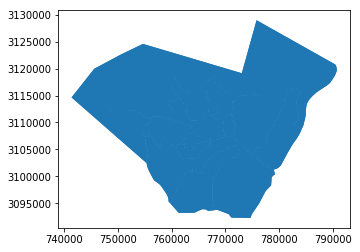

In [19]:
pdata2.plot()

In [20]:
a = pdata2['geometry'][0]

In [21]:
print(a.bounds)

(759822.625, 3093213.973000005, 767898.0729999989, 3101912.4070000052)


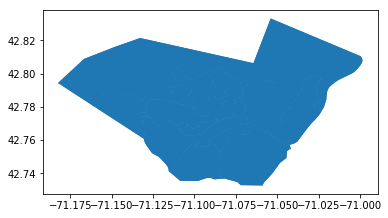

In [22]:
pdata3.plot()

In [23]:
b = pdata3['geometry']
# print(b.bounds)

In [24]:
minlong = b.bounds['minx'].min()

In [25]:
print(minlong)

-71.182398059322


In [26]:
maxlong = b.bounds['maxx'].max()
print(maxlong)

-70.99860193854025


In [27]:
minlat = b.bounds['miny'].min()
print(minlat)
maxlat = b.bounds['maxy'].max()
print(maxlat)

42.73246271031731
42.833276451805006


In [28]:
p1 = Point(-71.105902, 42.767552) # lies in polygon 5 and 40

#### Plotting the exterior points of a Polygon on the map of Haverhill in crs epsg:4326

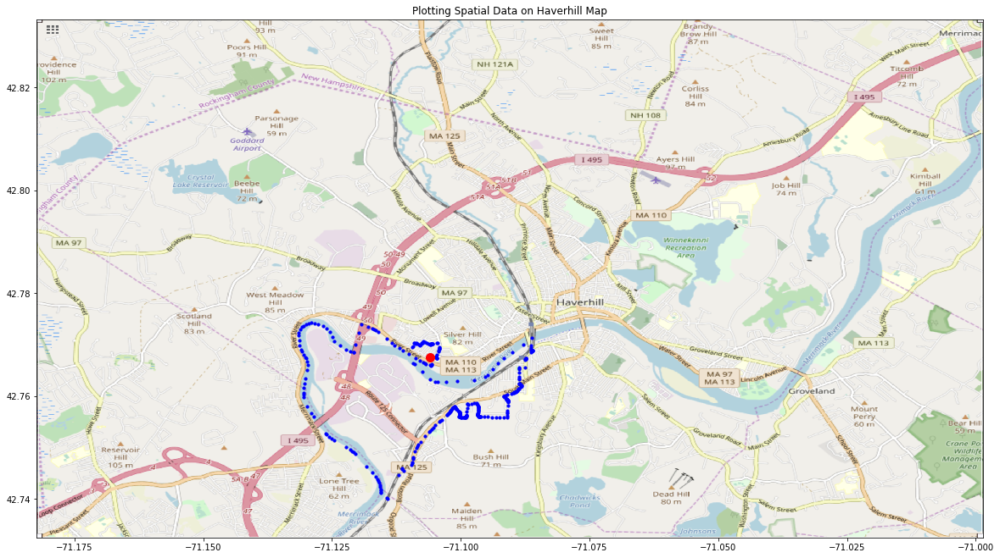

In [29]:
haverhillmap = plt.imread('./haverhillmap.png')
# plt.figure(figsize=(20,20))
# plt.imshow(haverhillmap)
# plt.show()
BBox = (minlong,maxlong,minlat,maxlat)
poly = pdata3['geometry'][40]
x,y = poly.exterior.coords.xy
fig, ax = plt.subplots(figsize = (20,20))
ax.scatter(x, y, zorder=1, alpha= 1, c='b', s=10)
ax.scatter(p1.x, p1.y, zorder=1, alpha= 1, c='r', s=100)
ax.set_title('Plotting Spatial Data on Haverhill Map')
ax.set_xlim(minlong,maxlong)
ax.set_ylim(minlat,maxlat)
ax.imshow(haverhillmap, zorder=0, extent = BBox, aspect= 'equal')
# ax.imshow(haverhillmap, zorder=0, aspect= 'equal')

#### Plotting the geometries in the shapefile onto the basemap of Haverhill as obtained from Contextily. Contextily requires the crs to be epsg:3857

/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


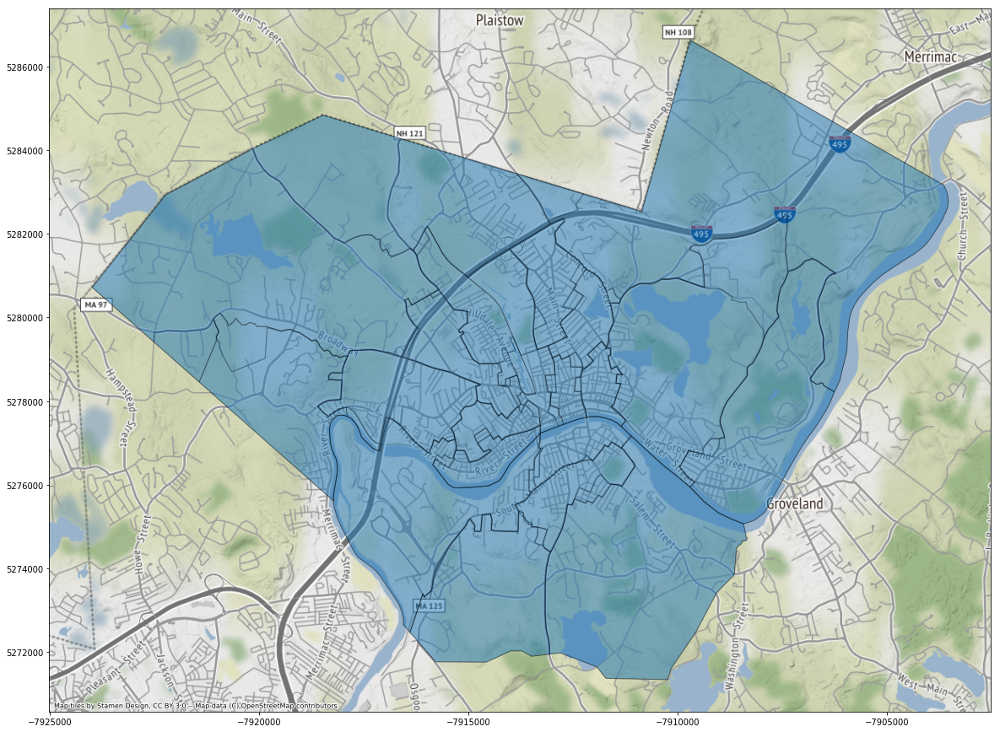

In [30]:
# fig, ax = plt.subplots(figsize = (20,20))
haverhillmap = plt.imread('./haverhillmap.png')
ax = pdata2['geometry'].to_crs(epsg=3857).plot(alpha=0.3,edgecolor='k', figsize=(20,20))
ctx.add_basemap(ax)
# ax.imshow(haverhillmap, zorder=.5, aspect= 'equal')
# plt.imshow(haverhillmap)
# minlong = b.bounds['minx'].min()

In [31]:
minx = pdata2['geometry'].to_crs(epsg=2249).bounds['minx'].min()
maxx = pdata2['geometry'].to_crs(epsg=2249).bounds['maxx'].max()
miny = pdata2['geometry'].to_crs(epsg=2249).bounds['miny'].min()
maxy = pdata2['geometry'].to_crs(epsg=2249).bounds['maxy'].max()

/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


#### Plotting the exterior points of a Polygon on the map of Haverhill in crs epsg:2249

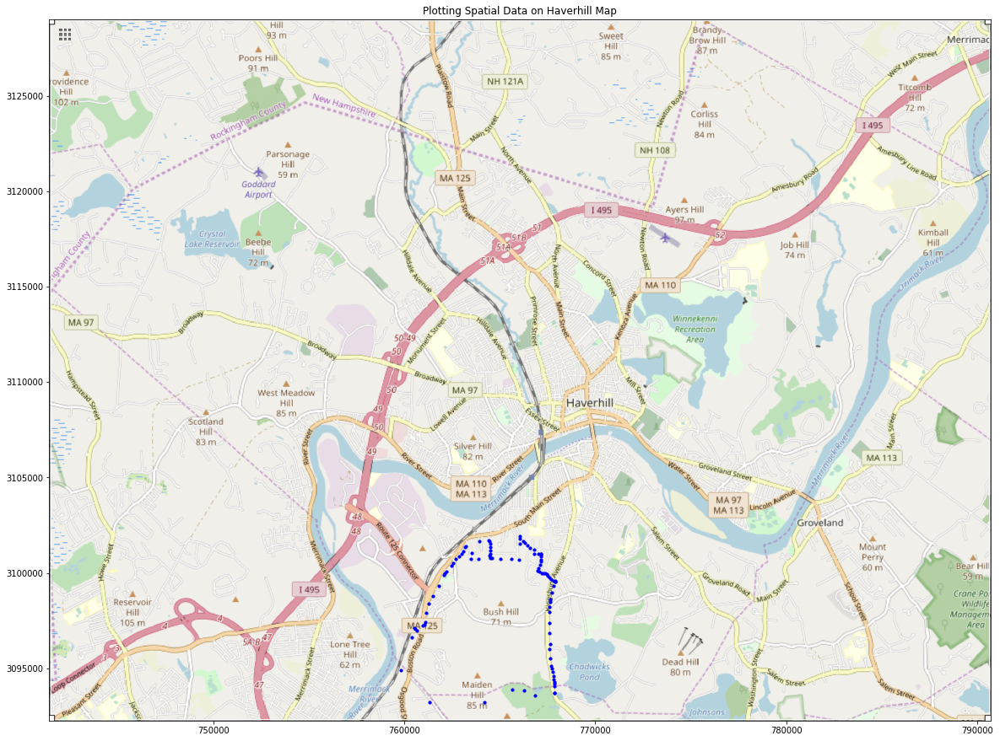

In [32]:
haverhillmap = plt.imread('./haverhillmap.png')
# plt.figure(figsize=(20,20))
# plt.imshow(haverhillmap)
# plt.show()
BBox = (minx,maxx,miny,maxy)
pdataweb = pdata2['geometry'].to_crs(epsg=2249)
x,y = pdataweb[0].exterior.coords.xy
fig, ax = plt.subplots(figsize = (20,20))
ax.scatter(x, y, zorder=1, alpha= 1, c='b', s=10)
ax.set_title('Plotting Spatial Data on Haverhill Map')
ax.set_xlim(minx,maxx)
ax.set_ylim(miny,maxy)
ax.imshow(haverhillmap, zorder=0, extent = BBox, aspect= 'equal')

In [33]:
pdata2.crs

{'init': 'epsg:2249'}

In [34]:
# for i in range(42):
#     print(i,pdata3['geometry'][i].contains(p1))

In [35]:
p1.x,p1.y

(-71.105902, 42.767552)

### Reading the request data to map Lat, Long of requests to Points in Polygon

In [36]:
request = pd.read_csv("./haverhill-request/haverhill-request.csv", encoding = 'unicode_escape')

In [37]:
request.head()

,Request ID,Create Date,Master Request,Has Links,Status,Status Code,Last Action,Last Change,Close Date,Work Order Created,...,Cross Street ID,Cross Street,District ID,District,Escalations,Priority,Longitude,Latitude,Origin ID,Origin
0,5130,2017-01-03 13:11:00,0,False,Closed,1,2017-01-03 14:05:00,2017-01-03 14:05:00,2017-01-03 14:05:00,False,...,0,NaN,1,Mt Washington,0,2,-71.105902,42.767552,1,Call Center
1,5131,2017-01-03 13:29:00,0,False,Closed,1,2017-01-03 13:29:00,2017-01-03 13:29:00,2017-01-03 13:29:00,False,...,0,NaN,0,NaN,0,2,0.000000,0.000000,1,Call Center
2,5132,2017-01-03 13:33:00,0,False,Closed,1,2017-01-03 13:33:00,2017-01-03 13:33:00,2017-01-03 13:33:00,False,...,0,NaN,0,NaN,0,2,0.000000,0.000000,1,Call Center
3,5133,2017-01-03 13:47:00,0,False,Closed,1,2017-01-03 13:47:00,2017-01-03 13:47:00,2017-01-03 13:47:00,False,...,0,NaN,0,NaN,0,2,0.000000,0.000000,1,Call Center
4,5134,2017-01-03 13:47:00,0,False,Closed,1,2017-01-03 13:47:00,2017-01-03 13:47:00,2017-01-03 13:47:00,False,...,0,NaN,0,NaN,0,2,0.000000,0.000000,1,Call Center


In [38]:
req_with_lat_long = request.loc[request['Longitude']!= 0.0]

#### Getting geometries of the 7 wards of Haverhill

In [39]:
pdata2_ward7 = pdata2.loc[pdata2['Ward'] == '7']
pdata2_ward6 = pdata2.loc[pdata2['Ward'] == '6']
pdata2_ward5 = pdata2.loc[pdata2['Ward'] == '5']
pdata2_ward4 = pdata2.loc[pdata2['Ward'] == '4']
pdata2_ward3 = pdata2.loc[pdata2['Ward'] == '3']
pdata2_ward2 = pdata2.loc[pdata2['Ward'] == '2']
pdata2_ward1 = pdata2.loc[pdata2['Ward'] == '1']

In [40]:
# pt = Point(latlong[100])
# for i in range(len(pdata2['geometry'])):
#     print(pdata2['geometry'].to_crs(4326)[i].contains(pt))

In [41]:
pdata2_ward1_poly = pdata2_ward1['geometry'].to_crs(epsg=4326)
pdata2_ward2_poly = pdata2_ward2['geometry'].to_crs(epsg=4326)
pdata2_ward3_poly = pdata2_ward3['geometry'].to_crs(epsg=4326)
pdata2_ward4_poly = pdata2_ward4['geometry'].to_crs(epsg=4326)
pdata2_ward5_poly = pdata2_ward5['geometry'].to_crs(epsg=4326)
pdata2_ward6_poly = pdata2_ward6['geometry'].to_crs(epsg=4326)
pdata2_ward7_poly = pdata2_ward7['geometry'].to_crs(epsg=4326)
long = req_with_lat_long['Longitude']
lat = req_with_lat_long['Latitude']
latlong = list(zip(long,lat))

/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/Use

#### Filtering points into lists of 7 wards and preventing duplication of points in wards. Code takes ~40 mins to run

In [42]:
# This block of code takes some time to run. Under 40 mins. 
#This data is saved as shapefiles for 7 wards so this block doesn't have to be run again

pt_in_1 = []
pt_in_2 = []
pt_in_3 = []
pt_in_4 = []
pt_in_5 = []
pt_in_6 = []
pt_in_7 = []
for j in tqdm(range(len(latlong)),total = len(latlong)):
    pt = Point(latlong[j])
    for i in range(len(pdata2_ward1_poly)):
        if pdata2_ward1_poly[i].contains(pt):
            pt_in_1.append(pt)
            break

for j in tqdm(range(len(latlong)),total = len(latlong)):
    pt = Point(latlong[j])
    for i in range(len(pdata2_ward2_poly)):
        if pdata2_ward2_poly[i].contains(pt):
            if pt not in pt_in_1:
                pt_in_2.append(pt)
                break

for j in tqdm(range(len(latlong)),total = len(latlong)):
    pt = Point(latlong[j])
    for i in range(len(pdata2_ward3_poly)):
        if pdata2_ward3_poly[i].contains(pt):
            if pt not in pt_in_1:
                if pt not in pt_in_2:
                    pt_in_3.append(pt)
                    break

for j in tqdm(range(len(latlong)),total = len(latlong)):
    pt = Point(latlong[j])
    for i in range(len(pdata2_ward4_poly)):
        if pdata2_ward4_poly[i].contains(pt):
            if pt not in pt_in_1:
                if pt not in pt_in_2:
                    if pt not in pt_in_3:
                        pt_in_4.append(pt)
                        break

for j in tqdm(range(len(latlong)),total = len(latlong)):
    pt = Point(latlong[j])
    for i in range(len(pdata2_ward5_poly)):
        if pdata2_ward5_poly[i].contains(pt): 
            if pt not in pt_in_1:
                if pt not in pt_in_2:
                    if pt not in pt_in_3:
                        if pt not in pt_in_4:
                            pt_in_5.append(pt)
                            break

for j in tqdm(range(len(latlong)),total = len(latlong)):
    pt = Point(latlong[j])
    for i in range(len(pdata2_ward6_poly)):
        if pdata2_ward6_poly[i].contains(pt):
            if pt not in pt_in_1:
                if pt not in pt_in_2:
                    if pt not in pt_in_3:
                        if pt not in pt_in_4:
                            if pt not in pt_in_5:
                                pt_in_6.append(pt)
                                break

for j in tqdm(range(len(latlong)),total = len(latlong)):
    pt = Point(latlong[j])
    for i in range(len(pdata2_ward7_poly)):
        if pdata2_ward7_poly[i].contains(pt):
            if pt not in pt_in_1:
                if pt not in pt_in_2:
                    if pt not in pt_in_3:
                        if pt not in pt_in_4:
                            if pt not in pt_in_5:
                                if pt not in pt_in_6:
                                    pt_in_7.append(pt)
                                    break


In [43]:
print(len(pt_in_1))
print(len(pt_in_2))
print(len(pt_in_3))
print(len(pt_in_4))
print(len(pt_in_5))
print(len(pt_in_6))
print(len(pt_in_7))

2649
2509
2291
3427
2737
2309
2158


In [44]:
print(len(latlong))

18080


#### Making a geodataframe of the geometry points as filtered above and saving them with crs = epsg:4326

In [45]:
geometry = pt_in_1
crs = {'init': 'epsg:4326'}
gdfw1_4326 = gpd.GeoDataFrame(crs=crs, geometry=geometry)
# gdfw1_4326.head()
gdfw1_4326.to_file("ward1_pts.shp")
geometry = pt_in_2
crs = {'init': 'epsg:4326'}
gdfw2_4326 = gpd.GeoDataFrame(crs=crs, geometry=geometry)
# gdfw2_4326.head()
gdfw2_4326.to_file("ward2_pts.shp")
geometry = pt_in_3
crs = {'init': 'epsg:4326'}
gdfw3_4326 = gpd.GeoDataFrame(crs=crs, geometry=geometry)
gdfw3_4326.head()
gdfw3_4326.to_file("ward3_pts.shp")
geometry = pt_in_4
crs = {'init': 'epsg:4326'}
gdfw4_4326 = gpd.GeoDataFrame(crs=crs, geometry=geometry)
gdfw4_4326.head()
gdfw4_4326.to_file("ward4_pts.shp")
geometry = pt_in_5
crs = {'init': 'epsg:4326'}
gdfw5_4326 = gpd.GeoDataFrame(crs=crs, geometry=geometry)
gdfw5_4326.head()
gdfw5_4326.to_file("ward5_pts.shp")
geometry = pt_in_6
crs = {'init': 'epsg:4326'}
gdfw6_4326 = gpd.GeoDataFrame(crs=crs, geometry=geometry)
gdfw6_4326.head()
gdfw6_4326.to_file("ward6_pts.shp")
geometry = pt_in_7
crs = {'init': 'epsg:4326'}
gdfw7_4326 = gpd.GeoDataFrame(crs=crs, geometry=geometry)
gdfw7_4326.head()
gdfw7_4326.to_file("ward7_pts.shp")

#### Reading 7 ward shapefiles to geodataframe

In [46]:
ward1_pts = gpd.read_file("./ward1_pts.shp")
ward2_pts = gpd.read_file("./ward2_pts.shp")
ward3_pts = gpd.read_file("./ward3_pts.shp")
ward4_pts = gpd.read_file("./ward4_pts.shp")
ward5_pts = gpd.read_file("./ward5_pts.shp")
ward6_pts = gpd.read_file("./ward6_pts.shp")
ward7_pts = gpd.read_file("./ward7_pts.shp")

#### Converting the crs from epsg:4326 to epsg:2249 for plotting

In [47]:
ward1_pts = ward1_pts.to_crs(epsg=2249)
ward2_pts = ward2_pts.to_crs(epsg=2249)
ward3_pts = ward3_pts.to_crs(epsg=2249)
ward4_pts = ward4_pts.to_crs(epsg=2249)
ward5_pts = ward5_pts.to_crs(epsg=2249)
ward6_pts = ward6_pts.to_crs(epsg=2249)
ward7_pts = ward7_pts.to_crs(epsg=2249)
# ward1_pts

/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/Users/sarthakarora/anaconda3/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/Use

#### making list of points for scatter plots crs = epsg:2249

In [48]:
x1_2249 = []
y1_2249 = []
for pt in ward1_pts['geometry']:
    x1_2249.append(pt.x)
    y1_2249.append(pt.y)
x2_2249 = []
y2_2249 = []
for pt in ward2_pts['geometry']:
    x2_2249.append(pt.x)
    y2_2249.append(pt.y)
x3_2249 = []
y3_2249 = []
for pt in ward3_pts['geometry']:
    x3_2249.append(pt.x)
    y3_2249.append(pt.y)
x4_2249 = []
y4_2249 = []
for pt in ward4_pts['geometry']:
    x4_2249.append(pt.x)
    y4_2249.append(pt.y)
x5_2249 = []
y5_2249 = []
for pt in ward5_pts['geometry']:
    x5_2249.append(pt.x)
    y5_2249.append(pt.y)
x6_2249 = []
y6_2249 = []
for pt in ward6_pts['geometry']:
    x6_2249.append(pt.x)
    y6_2249.append(pt.y)
x7_2249 = []
y7_2249 = []
for pt in ward7_pts['geometry']:
    x7_2249.append(pt.x)
    y7_2249.append(pt.y)

In [49]:
x1_2249

[765863.7167318821,
 762724.3872545066,
 766995.4783386387,
 765658.0344747909,
 760919.9041008224,
 763295.1714337461,
 764852.5468498181,
 762937.4889150513,
 764593.7167648016,
 764379.069919029,
 766501.7631916131,
 767226.619521718,
 764165.1762293155,
 763600.5392910131,
 761159.0269280986,
 766196.0684835749,
 765800.7577450722,
 766551.8663530729,
 765605.9009932582,
 767977.4144090975,
 764466.5770807059,
 765475.3270624181,
 760743.9326861758,
 766135.7192250111,
 763111.2302379868,
 766594.668287163,
 764553.4626973567,
 764553.4626973567,
 760871.2599284878,
 761023.0035448828,
 766273.4386882404,
 763381.6408584473,
 766409.9655754276,
 766857.1855483119,
 766234.4190642082,
 763030.2938571414,
 767875.797245875,
 761073.75388726,
 766373.7857993782,
 766494.9932701363,
 761023.0035448895,
 765856.7049031717,
 766471.4326682137,
 765012.8816705842,
 765734.4594087406,
 765954.5531300507,
 765954.5531300507,
 762227.4215220587,
 765664.609337708,
 761306.4681748895,
 767052

In [50]:
sum([len(x1_2249),len(x2_2249),len(x3_2249),len(x4_2249),len(x5_2249),len(x6_2249),len(x7_2249)])

18080

#### making list of points crs = epsg:4326

In [51]:
x1 = []
y1 = []
# pt_in_1
for pt in pt_in_1:
    x1.append(pt.x)
    y1.append(pt.y)
x2 = []
y2 = []
for pt in pt_in_2:
    x2.append(pt.x)
    y2.append(pt.y)
x3 = []
y3 = []
for pt in pt_in_3:
    x3.append(pt.x)
    y3.append(pt.y)
x4 = []
y4 = []
for pt in pt_in_4:
    x4.append(pt.x)
    y4.append(pt.y)
x5 = []
y5 = []
for pt in pt_in_5:
    x5.append(pt.x)
    y5.append(pt.y)
x6 = []
y6 = []
for pt in pt_in_6:
    x6.append(pt.x)
    y6.append(pt.y)
x7 = []
y7 = []
for pt in pt_in_7:
    x7.append(pt.x)
    y7.append(pt.y)

In [52]:
x1

[-71.09145639999997,
 -71.1031663,
 -71.0871851,
 -71.0921867,
 -71.10978790000001,
 -71.10106209999998,
 -71.09518300000002,
 -71.10227789999998,
 -71.09620330000001,
 -71.097013,
 -71.0890776,
 -71.08634059999997,
 -71.09781120000002,
 -71.09990399999998,
 -71.10890310000002,
 -71.09019239999998,
 -71.0916489,
 -71.08877110000003,
 -71.09239680000002,
 -71.083578,
 -71.0966227,
 -71.09290190000002,
 -71.1104684,
 -71.09029450000001,
 -71.1016916,
 -71.0887166,
 -71.0963455,
 -71.0963455,
 -71.10996780000002,
 -71.1093625,
 -71.08991249999997,
 -71.10064239999997,
 -71.08928570000002,
 -71.08770950000002,
 -71.09005409999997,
 -71.10204120000003,
 -71.0838911,
 -71.1092118,
 -71.08953910000002,
 -71.08908889999998,
 -71.10936249999997,
 -71.0914612,
 -71.08918180000002,
 -71.09459699999998,
 -71.0919389,
 -71.0910702,
 -71.0910702,
 -71.1048892,
 -71.09219400000002,
 -71.1083756,
 -71.08703345060341,
 -71.0998,
 -71.1020412,
 -71.0918612,
 -71.10463070000003,
 -71.101838,
 -71.1018711

In [53]:
minx = pdata2.bounds['minx'].min()
maxx = pdata2.bounds['maxx'].max()
miny = pdata2.bounds['miny'].min()
maxy = pdata2.bounds['maxy'].max()
print(minx, maxx, miny, maxy)

741416.4714999944 790721.7534999996 3092260.726999998 3129010.5222499967


#### Plotting all (crs=epsg:2249) points as different wards on basemap of Haverhill

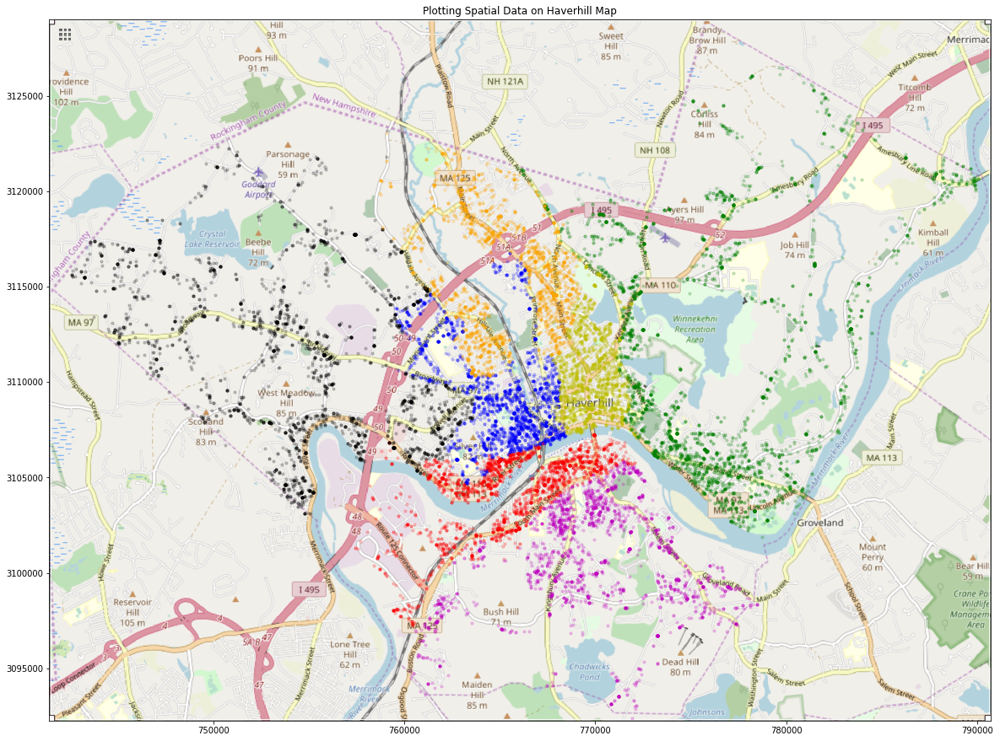

In [54]:
haverhillmap = plt.imread('./haverhillmap.png')
# plt.figure(figsize=(20,20))
# plt.imshow(haverhillmap)
# plt.show()
BBox = (minx,maxx,miny,maxy)
# poly = pdata3['geometry'][40]
# x,y = poly.exterior.coords.xy
fig, ax = plt.subplots(figsize = (20,20))
ax.scatter(x1_2249, y1_2249, zorder=1, alpha= 0.2, c='b', s=10)
ax.scatter(x2_2249, y2_2249, zorder=1, alpha= 0.2, c='r', s=10)
ax.scatter(x3_2249, y3_2249, zorder=1, alpha= 0.2, c='y', s=10)
ax.scatter(x4_2249, y4_2249, zorder=1, alpha= 0.2, c='g', s=10)
ax.scatter(x5_2249, y5_2249, zorder=1, alpha= 0.2, c='black', s=10)
ax.scatter(x6_2249, y6_2249, zorder=1, alpha= 0.2, c='orange', s=10)
ax.scatter(x7_2249, y7_2249, zorder=1, alpha= 0.2, c='m', s=10)
# ax.scatter(p1.x, p1.y, zorder=1, alpha= 1, c='r', s=100)
ax.set_title('Plotting Spatial Data on Haverhill Map')
ax.set_xlim(minx,maxx)
ax.set_ylim(miny,maxy)
ax.imshow(haverhillmap, zorder=0, extent = BBox, aspect= 'equal')
# ax.imshow(haverhillmap, zorder=0, aspect= 'equal')

In [55]:
# creating a geometry column 
geometry = [Point(xy) for xy in zip(x1_2249, y1_2249)]
# Coordinate reference system : WGS84
# crs = {'init': 'epsg:4326'}
# Creating a Geographic data frame 
# gdf1_4326 = gpd.GeoDataFrame(crs=crs, geometry=geometry)
# gdf1_4326.head()
gdf1_2249 = gpd.GeoDataFrame(geometry=geometry)

In [56]:
gdf1_2249['geometry']

0       POINT (765863.7167318821 3107017.266129236)
1       POINT (762724.3872545066 3105961.186705472)
2       POINT (766995.4783386387 3110143.946607429)
3       POINT (765658.0344747909 3109022.663949786)
4       POINT (760919.9041008224 3111737.834561228)
5       POINT (763295.1714337461 3104730.406888251)
6       POINT (764852.5468498181 3109236.890738388)
7       POINT (762937.4889150513 3111420.221203256)
8       POINT (764593.7167648016 3106046.061574545)
9        POINT (764379.069919029 3105458.466570271)
10      POINT (766501.7631916131 3107160.324705999)
11       POINT (767226.619521718 3109233.811732587)
12      POINT (764165.1762293155 3105363.715063551)
13      POINT (763600.5392910131 3105929.853133217)
14      POINT (761159.0269280986 3111390.384275046)
15      POINT (766196.0684835749 3108484.001309158)
16      POINT (765800.7577450722 3109371.417973184)
17      POINT (766551.8663530729 3113838.111847265)
18       POINT (765605.9009932582 3108127.89058289)
19      POIN

#### Plotting a single ward's(Ward 1) geometry points on map of Haverhill

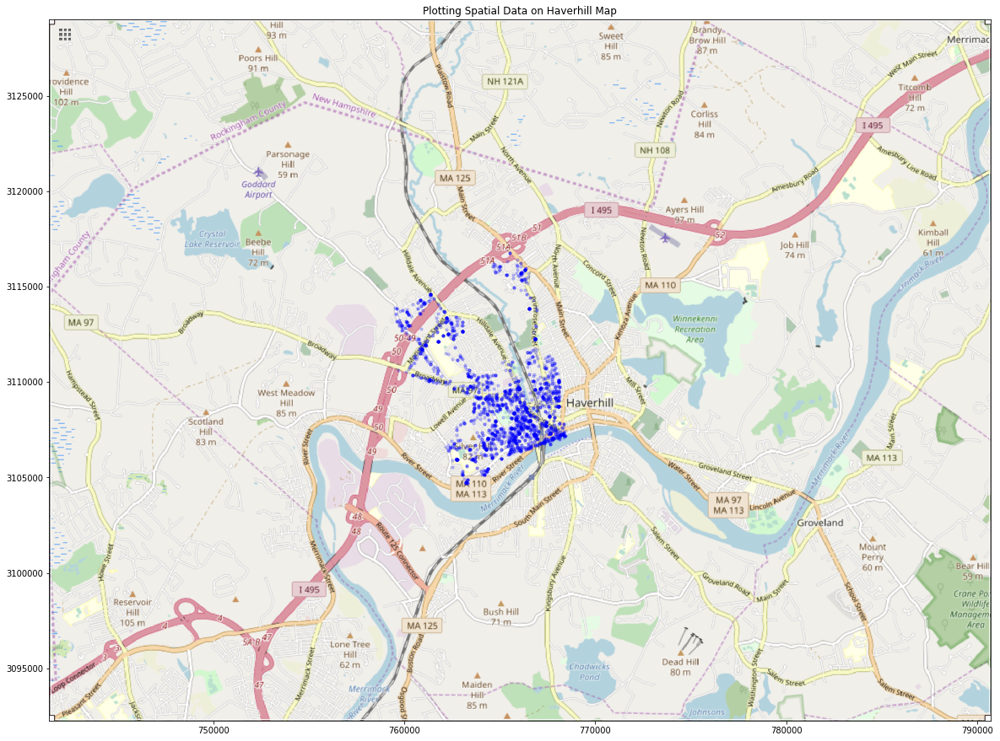

In [57]:
haverhillmap = plt.imread('./haverhillmap.png')
BBox = (minx,maxx,miny,maxy)
# pdataweb = pdata2['geometry'].to_crs(epsg=2249)
# x,y = pdataweb[0].exterior.coords.xy
fig, ax = plt.subplots(figsize = (20,20))
ax.scatter(gdf1_2249['geometry'].x, gdf1_2249['geometry'].y, zorder=1, alpha= 0.2, c='b', s=10)
ax.set_title('Plotting Spatial Data on Haverhill Map')
ax.set_xlim(minx,maxx)
ax.set_ylim(miny,maxy)
ax.imshow(haverhillmap, zorder=0, extent = BBox, aspect= 'equal')

In [58]:
w1_minx = pdata2_ward1_poly.bounds['minx'].min()
w1_maxx = pdata2_ward1_poly.bounds['maxx'].max()
w1_miny = pdata2_ward1_poly.bounds['miny'].min()
w1_maxy = pdata2_ward1_poly.bounds['maxy'].max()
print(w1_minx)
print(w1_maxx)
print(w1_miny)
print(w1_maxy)

-71.11579083946732
-71.08121297962792
42.76667196434169
42.80033252251221


In [59]:
w1_minx2249 = pdata2_ward1.bounds['minx'].min()
w1_maxx2249 = pdata2_ward1['geometry'].bounds['maxx'].max()
w1_miny2249 = pdata2_ward1['geometry'].bounds['miny'].min()
w1_maxy2249 = pdata2_ward1['geometry'].bounds['maxy'].max()
print(w1_minx2249)
print(w1_maxx2249)
print(w1_miny2249)
print(w1_maxy2249)

759312.863499999
768614.7497500032
3104672.3340000063
3116951.4440000057


#### Plotting Ward 1 points on map of Ward 1 Haverhill

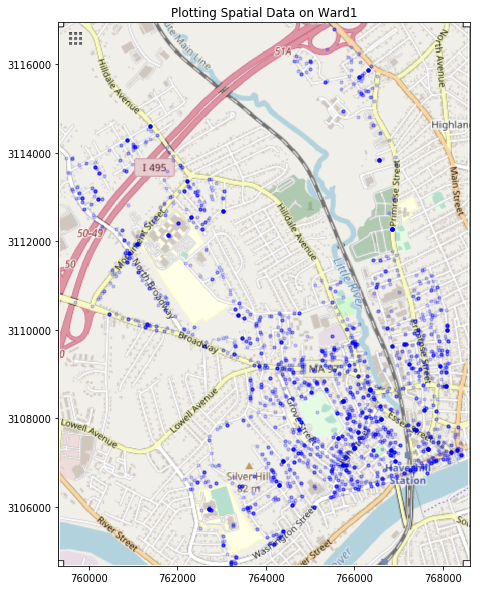

In [60]:
ward1 = plt.imread('./ward1.png')
w1box = (w1_minx2249,w1_maxx2249,w1_miny2249,w1_maxy2249)
# BBox = (minx,maxx,miny,maxy)
fig, ax = plt.subplots(figsize = (18,10))
ax.scatter(gdf1_2249['geometry'].x, gdf1_2249['geometry'].y, zorder=1, alpha= 0.2, c='b', s=10)
ax.set_title('Plotting Spatial Data on Ward1')
ax.set_xlim(w1_minx2249,w1_maxx2249)
ax.set_ylim(w1_miny2249,w1_maxy2249)
ax.imshow(ward1, zorder=0, extent = w1box)

In [61]:
# gdf1_2249['geometry'].x

In [62]:
w2_minx = pdata2_ward2_poly.bounds['minx'].min()
w2_maxx = pdata2_ward2_poly.bounds['maxx'].max()
w2_miny = pdata2_ward2_poly.bounds['miny'].min()
w2_maxy = pdata2_ward2_poly.bounds['maxy'].max()
print(w2_minx)
print(w2_maxx)
print(w2_miny)
print(w2_maxy)

-71.13144287848824
-71.06656124074732
42.739926597807596
42.77418539399721


In [63]:
w2_minx2249 = pdata2_ward2.bounds['minx'].min()
w2_maxx2249 = pdata2_ward2.bounds['maxx'].max()
w2_miny2249 = pdata2_ward2.bounds['miny'].min()
w2_maxy2249 = pdata2_ward2.bounds['maxy'].max()
print(w2_minx2249)
print(w2_maxx2249)
print(w2_miny2249)
print(w2_maxy2249)

755129.169750005
772552.3680000007
3094909.015499994
3107377.4067499936


In [64]:
# x2
geometry = [Point(xy) for xy in zip(x2_2249, y2_2249)]
# # Coordinate reference system : WGS84
# crs = {'init': 'epsg:4326'}
# # Creating a Geographic data frame 
gdf2_2249 = gpd.GeoDataFrame(geometry=geometry)
# gdf2_4326.head()
# gdf2_2249 = gdf2_4326.to_crs(epsg=2249)

#### Plotting Ward 2 points on map of Ward 2 Haverhill

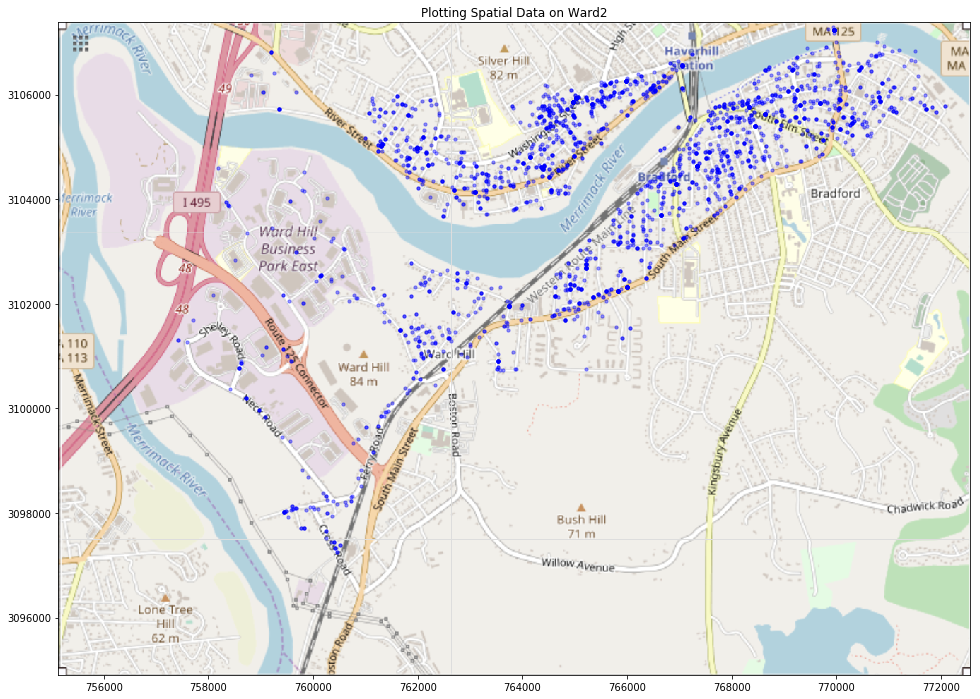

In [65]:
ward2 = plt.imread('./ward2_2.png')
w2box = (w2_minx2249,w2_maxx2249,w2_miny2249,w2_maxy2249)
# BBox = (minx,maxx,miny,maxy)
fig, ax = plt.subplots(figsize = (20,12))
ax.scatter(gdf2_2249['geometry'].x, gdf2_2249['geometry'].y, zorder=1, alpha= 0.4, c='b', s=10)
ax.set_title('Plotting Spatial Data on Ward2')
ax.set_xlim(w2_minx2249,w2_maxx2249)
ax.set_ylim(w2_miny2249,w2_maxy2249)
ax.imshow(ward2, zorder=0, extent = w2box ,aspect='equal')

In [66]:
w3_minx = pdata2_ward3_poly.bounds['minx'].min()
w3_maxx = pdata2_ward3_poly.bounds['maxx'].max()
w3_miny = pdata2_ward3_poly.bounds['miny'].min()
w3_maxy = pdata2_ward3_poly.bounds['maxy'].max()
print(w3_minx)
print(w3_maxx)
print(w3_miny)
print(w3_maxy)

-71.08514046853979
-71.06777810045773
42.772425294453754
42.79824539069292


In [67]:
w3_minx2249 = pdata2_ward3.bounds['minx'].min()
w3_maxx2249 = pdata2_ward3.bounds['maxx'].max()
w3_miny2249 = pdata2_ward3.bounds['miny'].min()
w3_maxy2249 = pdata2_ward3.bounds['maxy'].max()
print(w3_minx2249)
print(w3_maxx2249)
print(w3_miny2249)
print(w3_maxy2249)

767546.5487499982
772221.0380000025
3106808.795000002
3116210.575000003


In [68]:
geometry = [Point(xy) for xy in zip(x3_2249, y3_2249)]
gdf3_2249 = gpd.GeoDataFrame(geometry=geometry)

#### Plotting Ward 3 points on map of Ward 3 Haverhill

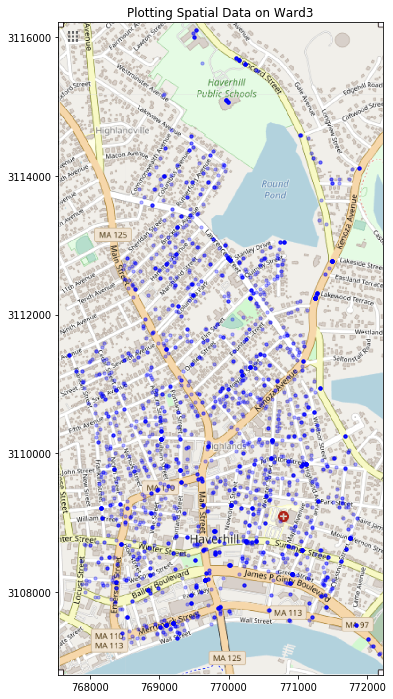

In [69]:
ward3 = plt.imread('./ward3.png')
w3box = (w3_minx2249,w3_maxx2249,w3_miny2249,w3_maxy2249)
# BBox = (minx,maxx,miny,maxy)
fig, ax = plt.subplots(figsize = (20,12))
ax.scatter(gdf3_2249['geometry'].x, gdf3_2249['geometry'].y, zorder=1, alpha= 0.3, c='b', s=10)
ax.set_title('Plotting Spatial Data on Ward3')
ax.set_xlim(w3_minx2249,w3_maxx2249)
ax.set_ylim(w3_miny2249,w3_maxy2249)
ax.imshow(ward3, zorder=0, extent = w3box ,aspect='equal')

In [70]:
w4_minx = pdata2_ward4_poly.bounds['minx'].min()
w4_maxx = pdata2_ward4_poly.bounds['maxx'].max()
w4_miny = pdata2_ward4_poly.bounds['miny'].min()
w4_maxy = pdata2_ward4_poly.bounds['maxy'].max()
print(w4_minx)
print(w4_maxx)
print(w4_miny)
print(w4_maxy)

-71.09121372827894
-70.99860193854025
42.757041969842945
42.833276451805006


In [71]:
w4_minx2249 = pdata2_ward4.bounds['minx'].min()
w4_maxx2249 = pdata2_ward4.bounds['maxx'].max()
w4_miny2249 = pdata2_ward4.bounds['miny'].min()
w4_maxy2249 = pdata2_ward4.bounds['maxy'].max()

In [72]:
geometry = [Point(xy) for xy in zip(x4_2249, y4_2249)]
gdf4_2249 = gpd.GeoDataFrame(geometry=geometry)

#### Plotting Ward 4 points on map of Ward 4 Haverhill

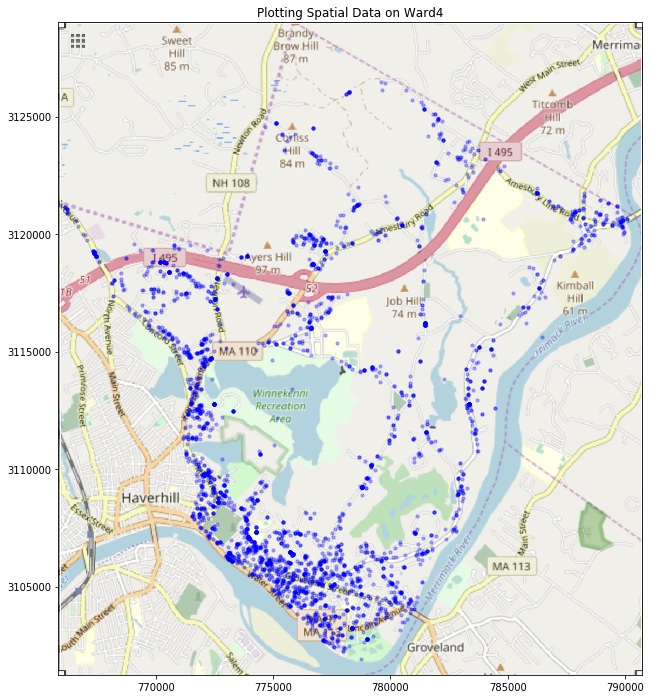

In [73]:
ward4 = plt.imread('./ward4.png')
w4box = (w4_minx2249,w4_maxx2249,w4_miny2249,w4_maxy2249)
# BBox = (minx,maxx,miny,maxy)
fig, ax = plt.subplots(figsize = (20,12))
ax.scatter(gdf4_2249['geometry'].x, gdf4_2249['geometry'].y, zorder=1, alpha= 0.3, c='b', s=10)
ax.set_title('Plotting Spatial Data on Ward4')
ax.set_xlim(w4_minx2249,w4_maxx2249)
ax.set_ylim(w4_miny2249,w4_maxy2249)
ax.imshow(ward4, zorder=0, extent = w4box ,aspect='equal')

In [74]:
w5_minx = pdata2_ward5_poly.bounds['minx'].min()
w5_maxx = pdata2_ward5_poly.bounds['maxx'].max()
w5_miny = pdata2_ward5_poly.bounds['miny'].min()
w5_maxy = pdata2_ward5_poly.bounds['maxy'].max()
print(w5_minx)
print(w5_maxx)
print(w5_miny)
print(w5_maxy)
w5_minx2249 = pdata2_ward5.bounds['minx'].min()
w5_maxx2249 = pdata2_ward5.bounds['maxx'].max()
w5_miny2249 = pdata2_ward5.bounds['miny'].min()
w5_maxy2249 = pdata2_ward5.bounds['maxy'].max()

-71.182398059322
-71.09902154388891
42.760639486845925
42.82147611077029


In [75]:
geometry = [Point(xy) for xy in zip(x5_2249, y5_2249)]
gdf5_2249 = gpd.GeoDataFrame(geometry=geometry)

#### Plotting Ward 5 points on map of Ward 5 Haverhill

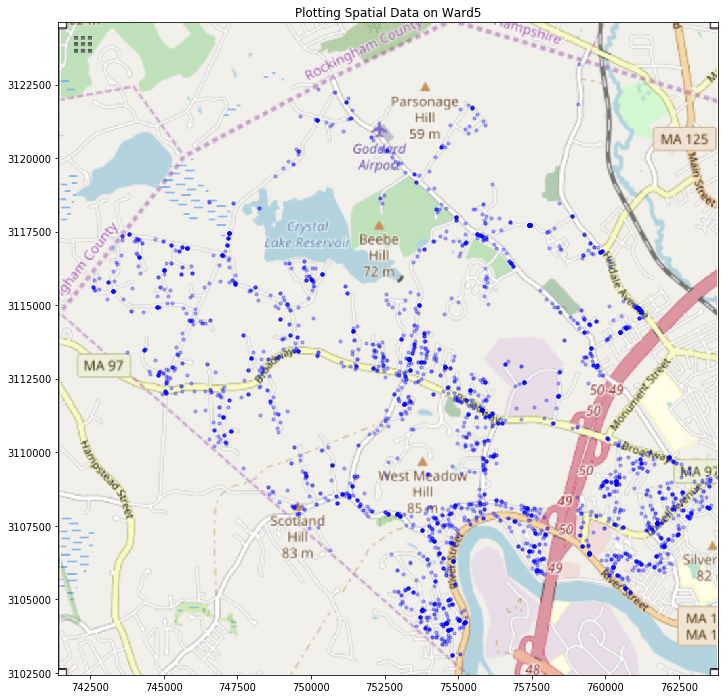

In [76]:
ward5 = plt.imread('./ward5.png')
w5box = (w5_minx2249,w5_maxx2249,w5_miny2249,w5_maxy2249)
# BBox = (minx,maxx,miny,maxy)
fig, ax = plt.subplots(figsize = (20,12))
ax.scatter(gdf5_2249['geometry'].x, gdf5_2249['geometry'].y, zorder=1, alpha= 0.3, c='b', s=10)
ax.set_title('Plotting Spatial Data on Ward5')
ax.set_xlim(w5_minx2249,w5_maxx2249)
ax.set_ylim(w5_miny2249,w5_maxy2249)
ax.imshow(ward5, zorder=0, extent = w5box ,aspect='equal')

In [77]:
w6_minx = pdata2_ward6_poly.bounds['minx'].min()
w6_maxx = pdata2_ward6_poly.bounds['maxx'].max()
w6_miny = pdata2_ward6_poly.bounds['miny'].min()
w6_maxy = pdata2_ward6_poly.bounds['maxy'].max()
print(w6_minx)
print(w6_maxx)
print(w6_miny)
print(w6_maxy)
w6_minx2249 = pdata2_ward6.bounds['minx'].min()
w6_maxx2249 = pdata2_ward6.bounds['maxx'].max()
w6_miny2249 = pdata2_ward6.bounds['miny'].min()
w6_maxy2249 = pdata2_ward6.bounds['maxy'].max()

-71.14792830693501
-71.07637731848308
42.77739422924461
42.82147611077029


In [78]:
geometry = [Point(xy) for xy in zip(x6_2249, y6_2249)]
gdf6_2249 = gpd.GeoDataFrame(geometry=geometry)

#### Plotting Ward 6 points on map of Ward 6 Haverhill

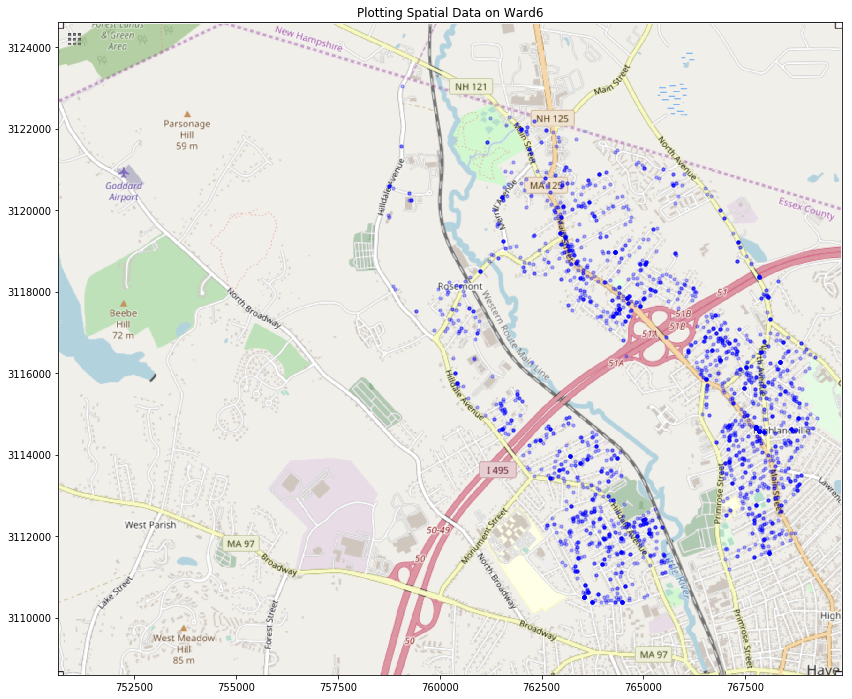

In [79]:
ward6 = plt.imread('./ward6.png')
w6box = (w6_minx2249,w6_maxx2249,w6_miny2249,w6_maxy2249)
# BBox = (minx,maxx,miny,maxy)
fig, ax = plt.subplots(figsize = (20,12))
ax.scatter(gdf6_2249['geometry'].x, gdf6_2249['geometry'].y, zorder=1, alpha= 0.3, c='b', s=10)
ax.set_title('Plotting Spatial Data on Ward6')
ax.set_xlim(w6_minx2249,w6_maxx2249)
ax.set_ylim(w6_miny2249,w6_maxy2249)
ax.imshow(ward6, zorder=0, extent = w6box ,aspect='equal')

In [80]:
w7_minx = pdata2_ward7_poly.bounds['minx'].min()
w7_maxx = pdata2_ward7_poly.bounds['maxx'].max()
w7_miny = pdata2_ward7_poly.bounds['miny'].min()
w7_maxy = pdata2_ward7_poly.bounds['maxy'].max()
print(w7_minx)
print(w7_maxx)
print(w7_miny)
print(w7_maxy)
w7_minx2249 = pdata2_ward7.bounds['minx'].min()
w7_maxx2249 = pdata2_ward7.bounds['maxx'].max()
w7_miny2249 = pdata2_ward7.bounds['miny'].min()
w7_maxy2249 = pdata2_ward7.bounds['maxy'].max()

-71.11415884672998
-71.04176979172416
42.73246271031731
42.770974253568106


In [81]:
geometry = [Point(xy) for xy in zip(x7_2249, y7_2249)]
gdf7_2249 = gpd.GeoDataFrame(geometry=geometry)

#### Plotting Ward 7 points on map of Ward 7 Haverhill

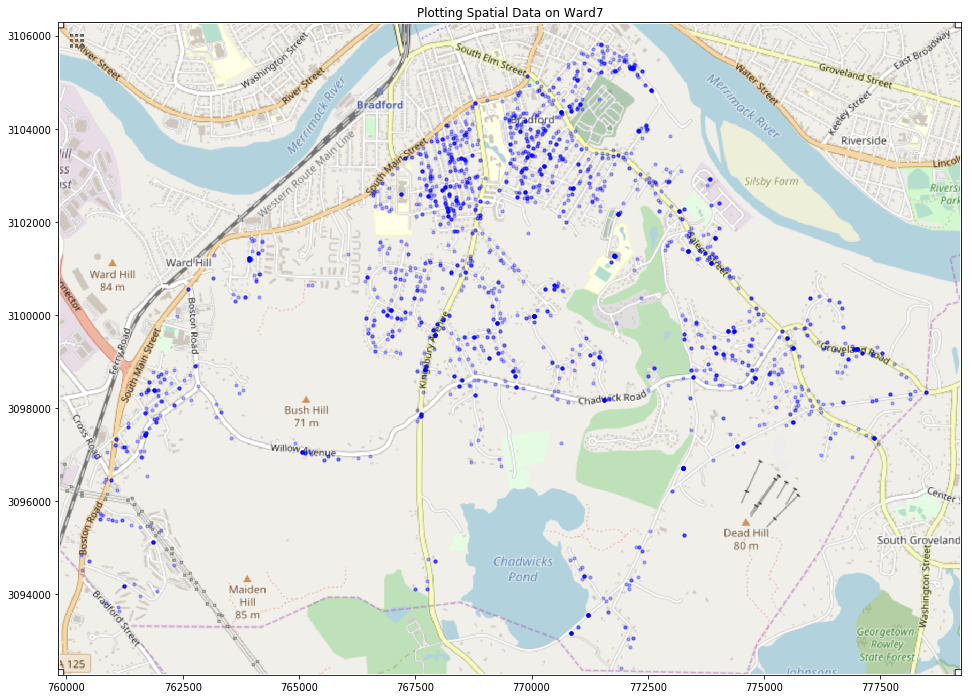

In [82]:
ward7 = plt.imread('./ward7.png')
w7box = (w7_minx2249,w7_maxx2249,w7_miny2249,w7_maxy2249)
# BBox = (minx,maxx,miny,maxy)
fig, ax = plt.subplots(figsize = (20,12))
ax.scatter(gdf7_2249['geometry'].x, gdf7_2249['geometry'].y, zorder=1, alpha= 0.3, c='b', s=10)
ax.set_title('Plotting Spatial Data on Ward7')
ax.set_xlim(w7_minx2249,w7_maxx2249)
ax.set_ylim(w7_miny2249,w7_maxy2249)
ax.imshow(ward7, zorder=0, extent = w7box ,aspect='equal')

In [83]:
# ward1_pts['geometry'].x
# w1_long = ward1_pts['geometry'].to_crs(epsg=4326).x
# w1_lat = ward1_pts['geometry'].to_crs(epsg=4326).y
w1_long = x1
w1_lat = y1
w1_req = request.loc[request['Longitude'].isin(w1_long) & request['Latitude'].isin(w1_lat)]
w1_req.groupby('Origin')['Request ID'].agg(len)
# x1

Origin
Call Center           2282
Control Panel           65
Report2Gov Android      23
Report2Gov iOS          67
Text Message             1
Website                211
Name: Request ID, dtype: int64

In [84]:
counts = w1_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]

In [85]:
w1_top10 = ['Highway - Pothole' ,                                   
'Snow Removal Issues - Sanding Request'  ,              
'A - Information Other' ,                               
'Snow Removal Issues - Replow Request' ,                
'TRASH - Missed Pick Up',                                
'Traffic/Street Lights - Street Light Repair',           
'Trash - Illegal Dumping',                               
'Street Sign Issues - Street Signs Missing/Damaged',     
'Tree Issues - City Owned Tree Issue',                   
'Highway - Sidewalk Issues']             

#### Bar graphs for top 10 Request Types in Ward 1

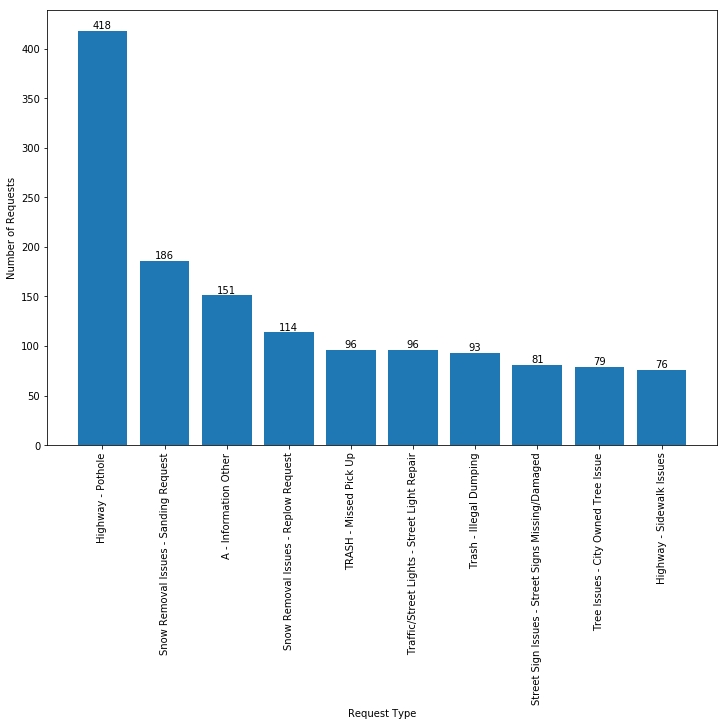

In [86]:
plt.figure(figsize=(12,8))
plt.xticks(np.arange(len(counts)),w1_top10,rotation=90)
bars = plt.bar(np.arange(len(counts)),counts)
plt.xlabel('Request Type')
plt.ylabel('Number of Requests')
for i,rect in enumerate(bars):
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,counts[i], ha='center', va='bottom')


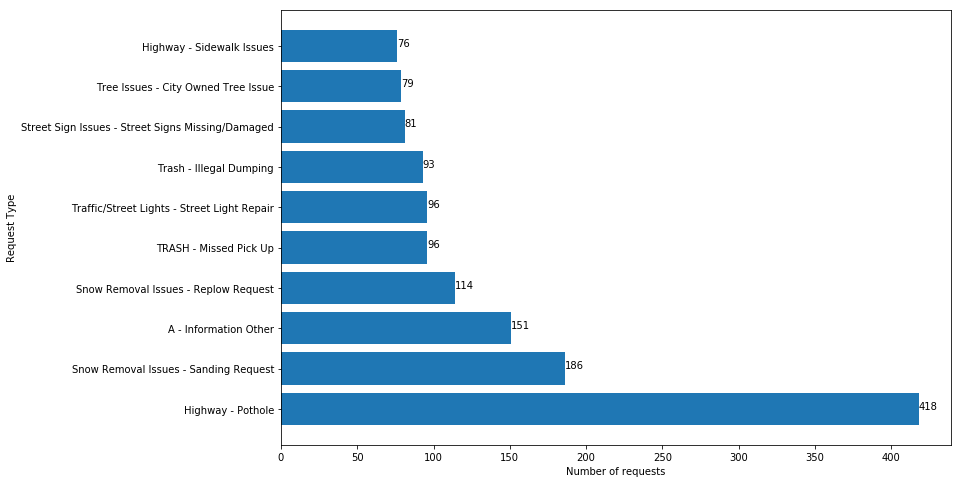

In [87]:
# print(counts)
plt.figure(figsize=(12,8))
plt.yticks(np.arange(len(counts)),w1_top10,rotation=0)
bars = plt.barh(np.arange(len(counts)),counts)
plt.xlabel('Number of requests')
plt.ylabel('Request Type')
for i,rect in enumerate(bars):
    width = rect.get_width()
    plt.text(width,rect.get_height()/2+rect.get_y(),counts[i])

In [88]:
w2_top10 = ['Highway - Pothole',
'A - Information Other',                                 
'Tree Issues - City Owned Tree Issue',                   
'Snow Removal Issues - Sanding Request',                 
'Highway - Sidewalk Issues',                             
'Snow Removal Issues - Replow Request',                  
'Tree Issues - Tree Pruning/Trimming',                   
'TRASH - Missed Pick Up',                                
'Street Sign Issues - Street Signs Missing/Damaged',     
'Traffic/Street Lights - Street Light Repair']

In [89]:
# ward2_pts.x
# ward2_pts['geometry'] = ward2_pts['geometry'].to_crs(epsg=4326)
# ward2_pts['geometry'].crs
# w2_long = list(ward2_pts.x)
# w2_lat = list(ward2_pts.y)
# w2_long = [np.float64(x).round(7) for x in w2_long]
# w2_lat = [np.float64(x).round(7) for x in w2_lat]
# type(w2_long[0])
# request
# type(w2_long[0])
# print(request['Latitude'][0])
# print(w2_lat[0])
w2_long = x2
w2_lat = y2
w2_req = request.loc[request['Longitude'].isin(w2_long) & request['Latitude'].isin(w2_lat)]
w2_req.groupby('Origin')['Request ID'].agg(len)
w2_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]

Request Type
Highway - Pothole                                    357
Snow Removal Issues - Sanding Request                151
A - Information Other                                136
Tree Issues - City Owned Tree Issue                  129
Snow Removal Issues - Replow Request                 108
TRASH - Missed Pick Up                               100
Tree Issues - Tree Pruning/Trimming                   94
Highway - Sidewalk Issues                             84
Street Sign Issues - Street Signs Missing/Damaged     78
Traffic/Street Lights - Street Light Repair           77
Name: Request ID, dtype: int64

#### Bar graphs for top 10 Request Types in Ward 2

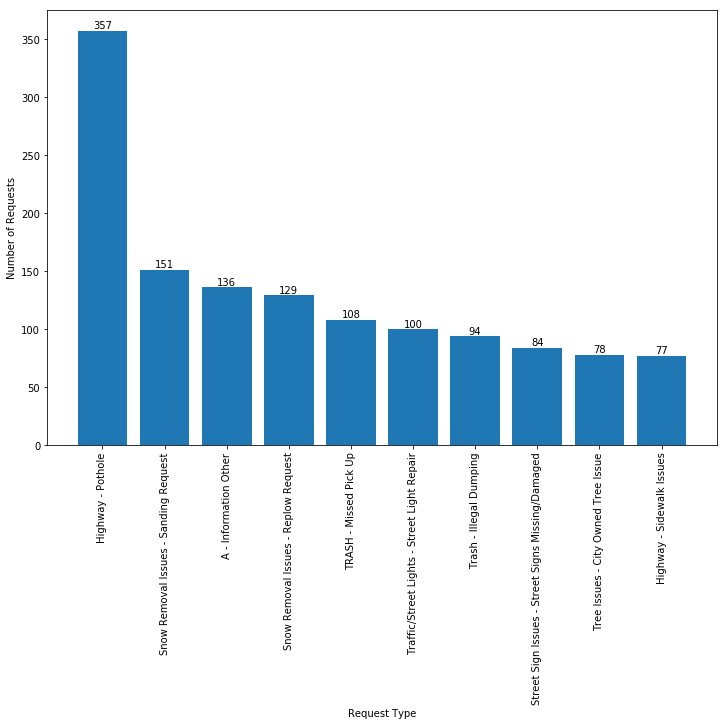

In [90]:
counts = w2_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
plt.figure(figsize=(12,8))
plt.xticks(np.arange(len(counts)),w1_top10,rotation=90)
bars = plt.bar(np.arange(len(counts)),counts)
plt.xlabel('Request Type')
plt.ylabel('Number of Requests')
for i,rect in enumerate(bars):
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,counts[i], ha='center', va='bottom')



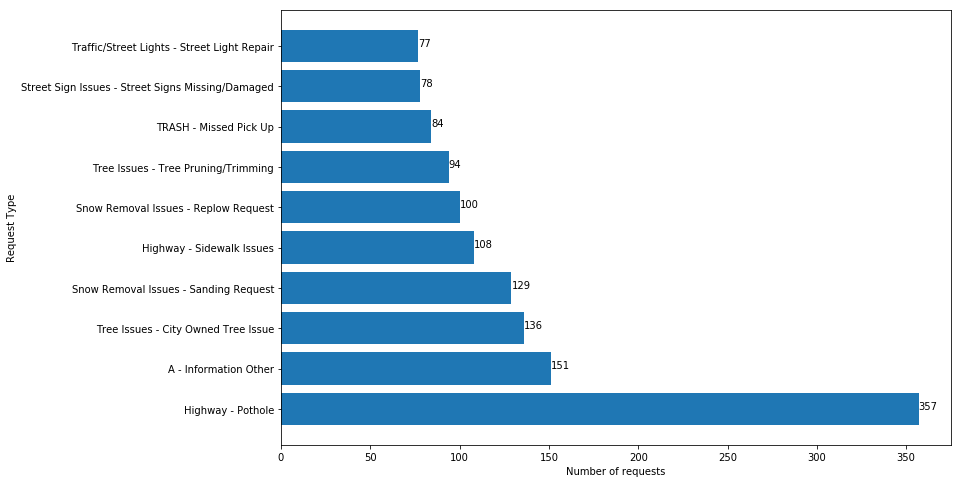

In [91]:
plt.figure(figsize=(12,8))
plt.yticks(np.arange(len(counts)),w2_top10,rotation=0)
bars = plt.barh(np.arange(len(counts)),counts)
plt.xlabel('Number of requests')
plt.ylabel('Request Type')
for i,rect in enumerate(bars):
    width = rect.get_width()
    plt.text(width,rect.get_height()/2+rect.get_y(),counts[i])

In [92]:
# ward3_pts['geometry'] = ward3_pts['geometry'].to_crs(epsg=4326)
# ward3_pts
# w3_long = list(ward3_pts['geometry'].x)
# w3_lat = list(ward3_pts['geometry'].y)
# w3_long = [np.float64(x).round(7) for x in w3_long]
# w3_lat = [np.float64(x).round(7) for x in w3_lat]
# print(w3_long[0])
# request['Longitude']
# request.loc[request['Longitude'].isin(w3_long) & request['Latitude'].isin(w3_lat)]
w3_req = request.loc[request['Longitude'].isin(x3) & request['Latitude'].isin(y3)]
# w3_req = request.loc[request['Longitude'].isin(w3_long) & request['Latitude'].isin(w3_lat)]
w3_req.groupby('Origin')['Request ID'].agg(len)
w3_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]

Request Type
Highway - Pothole                                    333
Highway - Sidewalk Issues                            124
A - Information Other                                117
Snow Removal Issues - Sanding Request                 97
Tree Issues - City Owned Tree Issue                   86
Snow Removal Issues - Replow Request                  79
Street Sign Issues - Street Signs Missing/Damaged     75
Highway - trash/debris pickup                         67
Traffic/Street Lights - Street Light Repair           66
Tree Issues - Tree Pruning/Trimming                   59
Name: Request ID, dtype: int64

In [93]:
w3_top10 = ['Highway - Pothole',  
'Highway - Sidewalk Issues', 
'A - Information Other',  
'Snow Removal Issues - Sanding Request',  
'Tree Issues - City Owned Tree Issue',                   
'Snow Removal Issues - Replow Request',                  
'Street Sign Issues - Street Signs Missing/Damaged',     
'Highway - trash/debris pickup',                         
'Traffic/Street Lights - Street Light Repair',           
'Tree Issues - Tree Pruning/Trimming' ]

#### Bar graph for top 10 Request Types in Ward 3

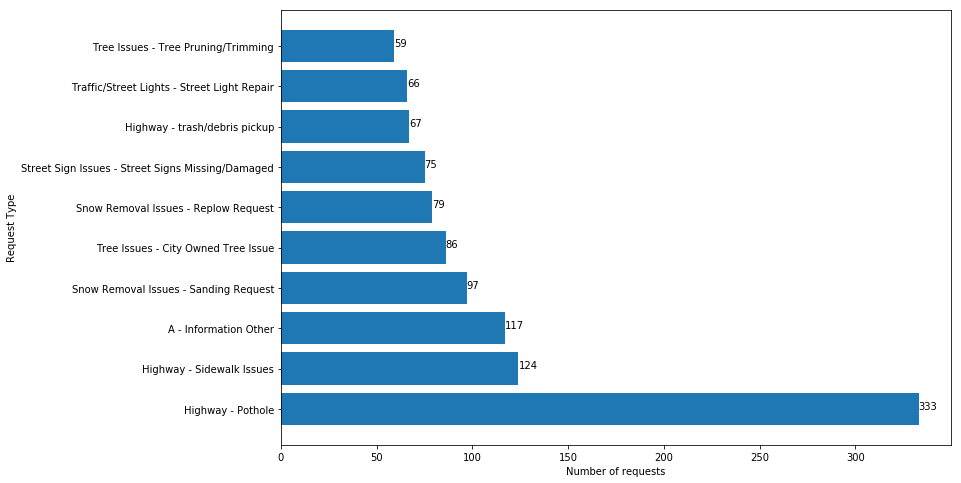

In [94]:
counts = w3_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
plt.figure(figsize=(12,8))
plt.yticks(np.arange(len(counts)),w3_top10,rotation=0)
bars = plt.barh(np.arange(len(counts)),counts)
plt.xlabel('Number of requests')
plt.ylabel('Request Type')
for i,rect in enumerate(bars):
    width = rect.get_width()
    plt.text(width,rect.get_height()/2+rect.get_y(),counts[i])

In [95]:
# w4_long = ward4_pts['geometry'].x
# w4_lat = ward4_pts['geometry'].y
# w4_req = request.loc[request['Longitude'].isin(w4_long) & request['Latitude'].isin(w4_lat)]
# w4_req.groupby('Origin')['Request ID'].agg(len)
# w4_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
w4_req = request.loc[request['Longitude'].isin(x4) & request['Latitude'].isin(y4)]
w4_req.groupby('Origin')['Request ID'].agg(len)
w4_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]

Request Type
Highway - Pothole                              662
Snow Removal Issues - Sanding Request          265
Tree Issues - City Owned Tree Issue            214
A - Information Other                          163
Traffic/Street Lights - Street Light Repair    111
Highway - Street issues                        108
Highway - Overgrown grass/weeds                103
Snow Removal Issues - Replow Request            99
TRASH - Missed Pick Up                          92
Tree Issues - Tree Pruning/Trimming             92
Name: Request ID, dtype: int64

In [96]:
w4_top10 = ['Highway - Pothole',                              
'Snow Removal Issues - Sanding Request' ,         
'Tree Issues - City Owned Tree Issue',            
'A - Information Other',                          
'Traffic/Street Lights - Street Light Repair',    
'Highway - Street issues',                        
'Highway - Overgrown grass/weeds',                
'Snow Removal Issues - Replow Request',            
'TRASH - Missed Pick Up',                          
'Tree Issues - Tree Pruning/Trimming']

#### Bar graph for top 10 Request Types in Ward 4

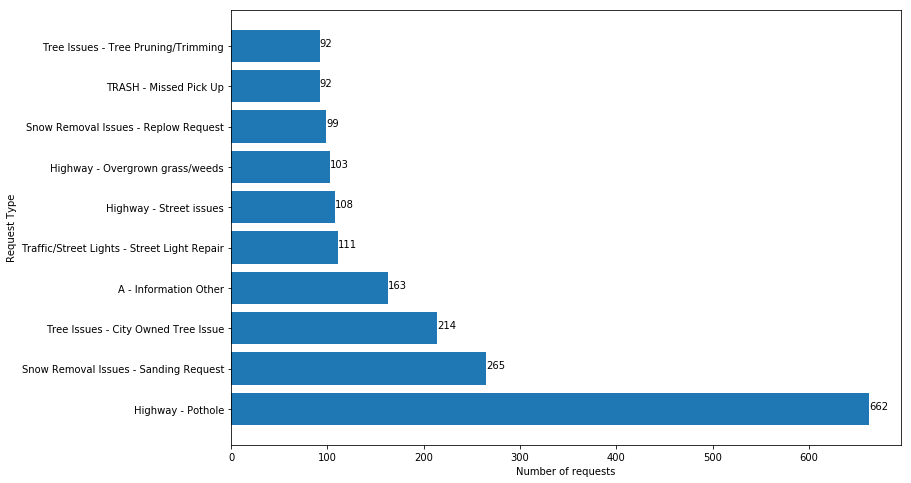

In [97]:
counts = w4_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
plt.figure(figsize=(12,8))
plt.yticks(np.arange(len(counts)),w4_top10,rotation=0)
bars = plt.barh(np.arange(len(counts)),counts)
plt.xlabel('Number of requests')
plt.ylabel('Request Type')
for i,rect in enumerate(bars):
    width = rect.get_width()
    plt.text(width,rect.get_height()/2+rect.get_y(),counts[i])

In [98]:
# w5_long = ward5_pts['geometry'].x
# w5_lat = ward5_pts['geometry'].y
# w5_req = request.loc[request['Longitude'].isin(w5_long) & request['Latitude'].isin(w5_lat)]
# w5_req.groupby('Origin')['Request ID'].agg(len)
# w5_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
w5_req = request.loc[request['Longitude'].isin(x5) & request['Latitude'].isin(y5)]
w5_req.groupby('Origin')['Request ID'].agg(len)
w5_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]

Request Type
Highway - Pothole                              535
TRASH - Missed Pick Up                         133
Snow Removal Issues - Sanding Request          130
A - Information Other                          127
Tree Issues - City Owned Tree Issue            115
Snow Removal Issues - Replow Request           112
Traffic/Street Lights - Street Light Repair    106
Highway - Overgrown grass/weeds                 84
Snow Removal Issues - Street Unplowed           81
Highway - Street issues                         80
Name: Request ID, dtype: int64

In [99]:
w5_top10 = ['Highway - Pothole',  
'TRASH - Missed Pick Up' ,                        
'Snow Removal Issues - Sanding Request' ,         
'A - Information Other' ,                         
'Tree Issues - City Owned Tree Issue',            
'Snow Removal Issues - Replow Request',           
'Traffic/Street Lights - Street Light Repair',    
'Highway - Overgrown grass/weeds',                 
'Snow Removal Issues - Street Unplowed',           
'Highway - Street issues']

#### Bar graph for top 10 Request Types in Ward 5

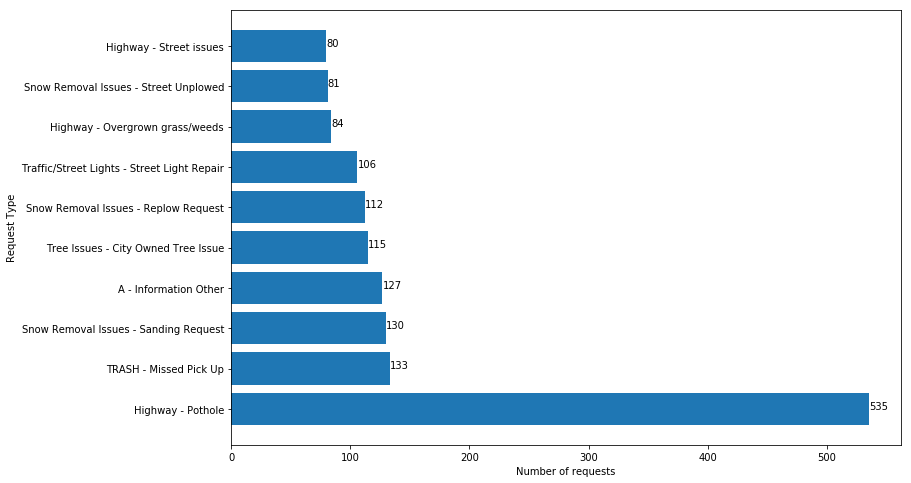

In [100]:
counts5 = w5_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
plt.figure(figsize=(12,8))
plt.yticks(np.arange(len(counts5)),w5_top10,rotation=0)
bars = plt.barh(np.arange(len(counts5)),counts5)
plt.xlabel('Number of requests')
plt.ylabel('Request Type')
for i,rect in enumerate(bars):
    width = rect.get_width()
    plt.text(width,rect.get_height()/2+rect.get_y(),counts5[i])

In [101]:
# w6_long = ward6_pts['geometry'].x
# w6_lat = ward6_pts['geometry'].y
# w6_req = request.loc[request['Longitude'].isin(w6_long) & request['Latitude'].isin(w6_lat)]
# w6_req.groupby('Origin')['Request ID'].agg(len)
# w6_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
w6_req = request.loc[request['Longitude'].isin(x6) & request['Latitude'].isin(y6)]
w6_req.groupby('Origin')['Request ID'].agg(len)
w6_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]

Request Type
Highway - Pothole                              349
Snow Removal Issues - Sanding Request          136
Tree Issues - City Owned Tree Issue            124
A - Information Other                          122
Snow Removal Issues - Replow Request           119
Traffic/Street Lights - Street Light Repair     97
TRASH - Missed Pick Up                          97
Highway - Sidewalk Issues                       65
Tree Issues - tree limb pickup                  60
Tree Issues - Tree Pruning/Trimming             55
Name: Request ID, dtype: int64

In [102]:
w6_top10 = ['Highway - Pothole',  
'Snow Removal Issues - Sanding Request',          
'Tree Issues - City Owned Tree Issue',            
'A - Information Other' ,                         
'Snow Removal Issues - Replow Request',           
'Traffic/Street Lights - Street Light Repair',     
'TRASH - Missed Pick Up',                          
'Highway - Sidewalk Issues',                       
'Tree Issues - tree limb pickup',                  
'Tree Issues - Tree Pruning/Trimming']

#### Bar graph for top 10 Request Types in Ward 6

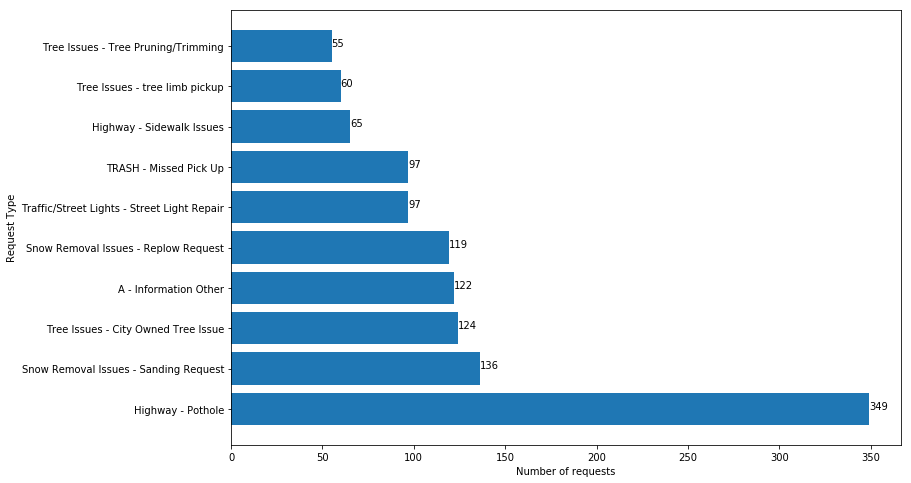

In [103]:
counts6 = w6_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
plt.figure(figsize=(12,8))
plt.yticks(np.arange(len(counts6)),w6_top10,rotation=0)
bars = plt.barh(np.arange(len(counts6)),counts6)
plt.xlabel('Number of requests')
plt.ylabel('Request Type')
for i,rect in enumerate(bars):
    width = rect.get_width()
    plt.text(width,rect.get_height()/2+rect.get_y(),counts6[i])

In [104]:
# w7_long = ward7_pts['geometry'].x
# w7_lat = ward7_pts['geometry'].y
# w7_req = request.loc[request['Longitude'].isin(w7_long) & request['Latitude'].isin(w7_lat)]
# w7_req.groupby('Origin')['Request ID'].agg(len)
# w7_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
w7_req = request.loc[request['Longitude'].isin(x7) & request['Latitude'].isin(y7)]
w7_req.groupby('Origin')['Request ID'].agg(len)
w7_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]

Request Type
Highway - Pothole                              269
Tree Issues - City Owned Tree Issue            143
A - Information Other                          121
Snow Removal Issues - Sanding Request          119
TRASH - Missed Pick Up                          99
Traffic/Street Lights - Street Light Repair     97
Highway - Street issues                         81
Highway - Sidewalk Issues                       68
Snow Removal Issues - Replow Request            62
Tree Issues - Tree Pruning/Trimming             58
Name: Request ID, dtype: int64

In [105]:
w7_top10 = ['Highway - Pothole',                              
'Tree Issues - City Owned Tree Issue',            
'A - Information Other' ,                         
'Snow Removal Issues - Sanding Request',          
'TRASH - Missed Pick Up',                          
'Traffic/Street Lights - Street Light Repair',     
'Highway - Street issues' ,                        
'Highway - Sidewalk Issues' ,                      
'Snow Removal Issues - Replow Request',            
'Tree Issues - Tree Pruning/Trimming']

#### Bar graph for top 10 Request Types in Ward 7

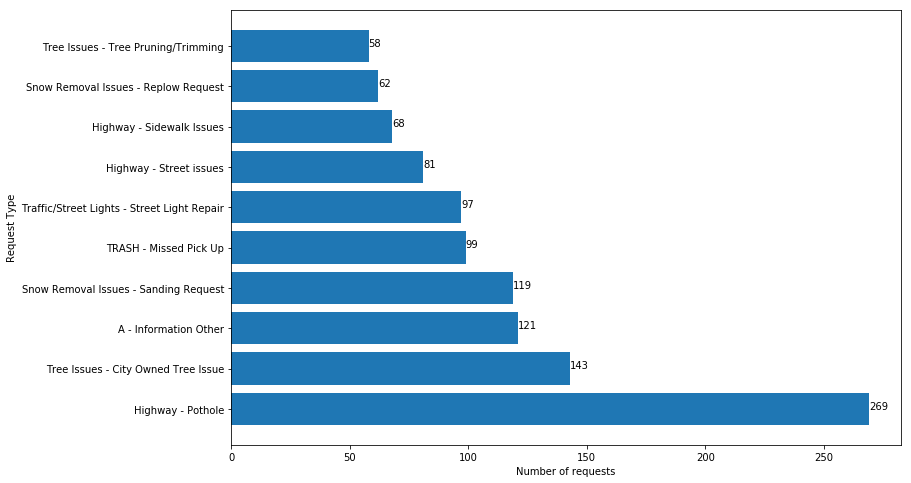

In [106]:
counts7 = w7_req.groupby('Request Type')['Request ID'].agg(len).sort_values(ascending = False)[0:10]
plt.figure(figsize=(12,8))
plt.yticks(np.arange(len(counts7)),w7_top10,rotation=0)
bars = plt.barh(np.arange(len(counts7)),counts7)
plt.xlabel('Number of requests')
plt.ylabel('Request Type')
for i,rect in enumerate(bars):
    width = rect.get_width()
    plt.text(width,rect.get_height()/2+rect.get_y(),counts7[i])